# Living in New York City

New York City is a city of 8.5 million inhabitants, a number which is still growing.

A lot of people are moving to New York to live since it is the epicentre of the world and THE city people imagine when they think about the American dream.

Finding a place in New York is however a difficult task. One wants to live in a nice neighbourhood in a comfortable house. For families moving to NYC it might also be important to find a place where they could stay there whole life instead of just finding a room to purely sleep.

To evaluate the living conditions in NYC, we looked at three categories:   
* Crime rate: nobody wants to get stabbed on his way to the grocerie store.
* Education : Families want there kids to have a nice future which all start with a proper educatio
* Housing: you still should be able to afford to buy a place in NYC and preferable with a good quality price ratio   

Besides looking at all these categories seperatly, we will also have a look if these metrics are correlated. Do high crime rates correspond with a lower graduation rate. Are neighbourhoods more prone to crime also cheaper to live in?

New York City has been ahead of his time since very long and has collecting data to support all these analysises. When other cities start collecting data in the same way, it might be useful to do scale this project up in other cities.

In [1]:
import os
import re
import math
from collections import defaultdict
import pandas as pd
import numpy as np
import branca
import json
import folium
import geopy

import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import bokeh
from bokeh.palettes import Spectral4
from bokeh.plotting import figure, output_file, show
from bokeh.models import Range1d
from bokeh.resources import CDN
from bokeh.embed import file_html
from bokeh.io import output_notebook

from IPython.core.display import display, HTML

# Turn slice copy warnings off
plt.ioff()
output_notebook()
pd.options.mode.chained_assignment = None


# import findspark
# findspark.init()
# from pyspark.sql import *
# from pyspark.sql.functions import *
# from pyspark.sql.functions import min
# from pyspark.sql.types import ArrayType, StringType, DoubleType, IntegerType, FloatType
# from pyspark import SparkContext

# spark = SparkSession.builder.getOrCreate()
# sc = spark.sparkContext

Loading BokehJS ...

## Housing  

When looking for housing, people want to buy as cheap as possible, a large area to live on and if it is possible with a view on Central Park. Achieving all of these is of course not possible. This webpage gives an overview of the most important metrics to consider when looking for a house in NYC and how each region of NYC scores on this metric. When looking for a house, people care most about the quality price ratio, measured in the area to live in and the price you have to pay for the property. The neighbourhood to live in is important as well but this is measured by other metrics like education and crime rates, analyzed further on in this notebook

We want to get a view on the current housing situation in NYC so that's why we first only work with the sales of the past 12 months. Let us first read in the data from the past 12 months, put it in the format we want and write it to a new file to read it faster the next time

In [2]:
#Read the data for all different boroughs
#All the files have the same format since they originate from the same source
df1 = pd.read_excel('./data/housing/rollingsales_manhattan.xls', header = 4)
df2 = pd.read_excel('./data/housing/rollingsales_queens.xls', header = 4)
df3 = pd.read_excel('./data/housing/rollingsales_brooklyn.xls', header = 4)
df4 = pd.read_excel('./data/housing/rollingsales_statenisland.xls', header = 4)
df5 = pd.read_excel('./data/housing/rollingsales_bronx.xls', header = 4)

#Put all data in one dataframe
df = df1.append(df2).append(df3).append(df4).append(df5)

#Write to csv to read it faster in future steps
df.to_csv('./data/housing/rollingsales_NYC.csv', index=False)

In [3]:
#Read data from csv
df = pd.read_csv('./data/housing/rollingsales_NYC.csv')

In [4]:
#Look at what data we have available
df.dtypes

BOROUGH                            int64
NEIGHBORHOOD                      object
BUILDING CLASS CATEGORY           object
TAX CLASS AT PRESENT              object
BLOCK                              int64
LOT                                int64
EASE-MENT                         object
BUILDING CLASS AT PRESENT         object
ADDRESS                           object
APARTMENT NUMBER                  object
ZIP CODE                           int64
RESIDENTIAL UNITS                  int64
COMMERCIAL UNITS                   int64
TOTAL UNITS                        int64
LAND SQUARE FEET                   int64
GROSS SQUARE FEET                  int64
YEAR BUILT                         int64
TAX CLASS AT TIME OF SALE          int64
BUILDING CLASS AT TIME OF SALE    object
SALE PRICE                         int64
SALE DATE                         object
dtype: object

Some features have a weird data format. It does not make sense to represent features as int64 when they are not being used for mathematical processing. That iss why we will first transform that data

In [5]:
df = df.astype({"BLOCK": str, "LOT": str, "ZIP CODE": str, "TAX CLASS AT TIME OF SALE": str});

id_borough = {1: "Manhattan", 2: "Bronx", 3:"Brooklyn", 4:"Queens", 5:"Staten Island"}
df = df.replace({"BOROUGH": id_borough})

We want to create a metric that indicates how affordable it is to live somewhere. Of course it is interesting to look at the sale price but this obviously depends on the living surface you get for it. That's why we will also look at the Gross Square Feet and the Number Of Units involved in the sale

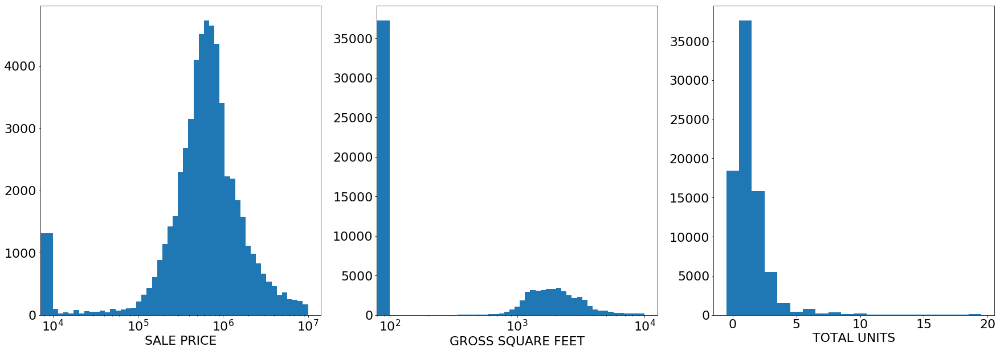

In [6]:
#Function to create bins with boundaries on the integer log axis
#This function is eventually not used
def log_bins(min_log=0, max_log=10, zero=True):
    bins_temp = np.linspace(1,9, num=9)
    bins = np.array([])
    for i in range(min_log, max_log):
        bins = np.append(bins, bins_temp*np.power(10,i))
    if(zero):
        bins = np.insert(bins, 0, 0, axis=0)
    return bins
    
plt.rcParams.update({'font.size': 22})

#Histogram of sale prices
plt.figure(figsize=(30,10))
plt.subplot(1,3,1)
plt.hist(df[df['SALE PRICE']>0 ]['SALE PRICE'], bins = np.insert(np.logspace(4, 7, 50), 0,0, axis=0))
plt.xscale("log");
plt.xlabel("SALE PRICE");

#Histogram of gross square feet in the building involved in the sale
plt.subplot(1,3,2)
plt.hist(df['GROSS SQUARE FEET'], bins = np.insert(np.logspace(2, 4, 50), 0,0, axis=0))
plt.xscale("log");
plt.xlabel("GROSS SQUARE FEET");

#Histogram of the number of units involved in the sale
plt.subplot(1,3,3)
plt.hist(df['TOTAL UNITS'], bins = np.insert(np.linspace(0, 20, 21), 0,0, axis=0), align='left');
plt.xlabel("TOTAL UNITS");

We see that most of the sales happened for an amount between 100K \\$ and 10M \\$. We also see that some houses were sold for less than 100K. As we don't think it is realistic to buy a house or appratment in NYC for less then 100K\\$ or even 0\\$, we decide not to take these transactions into account. For example a lot of them are sales of 1$ so either something fishy is going on there or a mistake was made when entering the data.

When looking at the Gross Square Feet, we see that for a lot of entries, this data is missing. We will of course not take into account entries which have a surface area of 0 to live on.

The same holds for the number of units. It doesn't make sense to pay for a house with zero units to live in so that is why we will just ignore these. We see that most of the sales consist of one unit, with some consisting of zero units. These is missing data and should be ignored. There are also some sales that consisted of 10 to even more then 100 units. Probably this were entire appartment buildings that were sold but when dividing the sales price by the number of units, this is still a good evaluation of the prices per unit that a regular user would pay although it could be a small underestimating since the one who buys the appartment building probably wants to gain money by selling the individual appartement a more expensive

One remark that could be made here is that we do not make a difference residential units and commercial units. Normally we should only take into account the residential ones since we are focussing on families wanting to live in NYC. It is however not feasible to estimate a number to subtract from the sales price to get the value of the residential units. Thats why, when evaluating this metric, we only take into account sales in which the number of residential units is larger than the number of commercial units.

In [7]:
nrResidentialUnits = df['RESIDENTIAL UNITS'].sum()
nrCommercialUnits = df['COMMERCIAL UNITS'].sum()
nrTotalUnits = df['TOTAL UNITS'].sum()

ratioRes = nrResidentialUnits / nrTotalUnits;
ratioCom = nrCommercialUnits / nrTotalUnits;

print("Total number of residential units: "+str(nrResidentialUnits)+ " ("+str(round(ratioRes*100,2))+"% of total units)")
print("Total number of commercial units: "+str(nrCommercialUnits)+ " ("+str(round(ratioCom*100,2))+"% of total units)")

print("\n\nNow only look at the sales in which at least one residential unit per sale was involved. \n\
So ignore the sales in which only commercial units were involved \n")

df_temp = df[df['RESIDENTIAL UNITS']>df['COMMERCIAL UNITS']]

nrResidentialUnits = df_temp['RESIDENTIAL UNITS'].sum()
nrCommercialUnits = df_temp['COMMERCIAL UNITS'].sum()
nrTotalUnits = df_temp['TOTAL UNITS'].sum()

ratioRes = nrResidentialUnits / nrTotalUnits;
ratioCom = nrCommercialUnits / nrTotalUnits

print("Total number of residential units: "+str(nrResidentialUnits)+ " ("+str(round(ratioRes*100,2))+"% of total units)")
print("Total number of commercial units: "+str(nrCommercialUnits)+ " ("+str(round(ratioCom*100,2))+"% of total units)")

Total number of residential units: 156385 (90.93% of total units)
Total number of commercial units: 13060 (7.59% of total units)


Now only look at the sales in which at least one residential unit per sale was involved. 
So ignore the sales in which only commercial units were involved 

Total number of residential units: 155462 (98.21% of total units)
Total number of commercial units: 2833 (1.79% of total units)


When we look at the number ratio of residential en commercial units in the total dataset, we see that quite a few of them are commercial units. Something strange however is that the total of both types doesn't add up to the number of total units. In the dataset there is nothing mentioned about other types of units. When we think about non-commercial or non-residential units, we think about for example churches, government offices, ... We think this might be the missing units since they cannot be really classified in one the above sections.

As mentioned before we will only take into account the sales in which the number of residential units is larger than the number of commercial units. When applying this filter we see that the ratio of commercial units to total units is drastically reduced. It might be exagerating that it can be neglected but we believe that the eventual dataset will give a representative metric for the user.

In [8]:
#Datastructures used for plotting purposes
boroughs = ['Manhattan', 'Brooklyn', 'Queens', 'Staten Island', 'Bronx']
color_dict = {'Manhattan': 'gold', 'Brooklyn': 'red', 'Queens': 'purple', 'Staten Island': 'green', 'Bronx': 'blue'}

In [9]:
#Filter data to remove unreliable data
df = df[df['SALE PRICE'] > 100000]
df_gsf = df[df['GROSS SQUARE FEET']>0] #Dataset to evaluate sale price per gross feet area 
df_unit = df[df['RESIDENTIAL UNITS']>df['COMMERCIAL UNITS']] #Dataset to evaluate sale price per number of units
df_gsf_unit = df[(df['RESIDENTIAL UNITS']>df['COMMERCIAL UNITS']) & (df['GROSS SQUARE FEET']>0)] #Dataset to evaluate gross feet area per unit

#Add new metrics on which to evaluate affordability
df_gsf['PRICE PER SQUARE FOOT'] = df_gsf['SALE PRICE']/df_gsf['GROSS SQUARE FEET']
df_unit['PRICE PER UNIT'] = df_unit['SALE PRICE']/df_unit['TOTAL UNITS']
df_gsf_unit['FEET PER UNIT'] = df_gsf_unit['GROSS SQUARE FEET']/df_gsf_unit['TOTAL UNITS']

### Price per square foot

In [10]:
#Function for the actual drawing of the histogram
def draw_histogram(p, hist, edges, color, borough):
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color=color, line_color=color, alpha=0.8, legend=borough)
   
    p.y_range.start = 0
    p.x_range = Range1d(edges[1], edges[-1])
    
    p.legend.location = "center_right"
    p.legend.background_fill_color = "#fefefe"
    p.grid.grid_line_color="grey"
    return p


In [11]:
#Function to create a histogram
def plot_histogram(data = None, feature = None, normalized=True, x_axis_type = 'log', bins = None, title='', x_label='', file_path='graph/housing/default.html'):
    p = figure(title=title, x_axis_type=x_axis_type);
    
    for i in boroughs:
        #Plot normalized histogram for each borough
        hist, edges = np.histogram(data[data['BOROUGH']==i][feature], bins = bins);
        p = draw_histogram(p, hist/sum(hist)*100, edges, color=color_dict[i], borough=str(i));
        
    p.xaxis.axis_label=x_label
    p.yaxis.axis_label='Distribution [%]'
    p.legend.location = "top_left"
    p.legend.click_policy="hide"
    
    output_file(file_path, title=title)
    
    show(p)

In [12]:
#Function to create a scatterplot
def plot_scatter(data = None, x_feature = None, y_feature = None, x_axis_type='log', y_axis_type='log', x_range = None, y_range = None, title='', x_label='', y_label='', file_path = 'graph/housing/default.html'):
    
    if(x_range == None):
        x_range = Range1d(data[x_feature].min()*0.8, data[x_feature].max()*1.10)
    if(y_range == None):
        y_range = Range1d(data[y_feature].min()*0.8, data[y_feature].max()*1.10)
        
    p = figure(x_axis_type=x_axis_type, y_axis_type=y_axis_type, x_range = x_range, y_range = y_range)
    
    p.title.text = title

    for i in boroughs:
        p.scatter(data[data['BOROUGH']==i][x_feature], data[data['BOROUGH']==i][y_feature],
                  marker='circle', size=3,
                  line_color=color_dict[i],
                  fill_color=color_dict[i],
                  alpha=0.5, line_alpha=0.5,
                  legend=i)
    p.yaxis.axis_label = y_label
    p.xaxis.axis_label = x_label
    p.legend.location = "top_left"
    p.legend.click_policy="hide"

    output_file(file_path, title=title)

    show(p)

In [13]:
#Function to draw a heatmap (choropleth) per zipcode
def draw_heatmap(name=None, data=None, feature= None, title = '', filepath = 'maps/housing/default.html'):
    #Create map centered in NYC
    pc = folium.Map(location=[40.75, -74]);
    
    #GeoJson map with the edges of both the boroughs and the postal codes
    postcode_edge = json.load(open(os.path.join('data', 'nyc-postcode.json')));
    borough_edge = json.load(open(os.path.join('data', 'nyc-boroughs.json')));

    
    folium.Choropleth(geo_data=postcode_edge,
                  name=name,
                  data=data,
                  columns=['ZIP CODE', feature],
                  bins = 9,
                  key_on = 'feature.properties.postalCode',
                    nan_fill_color='grey',
                  fill_color='BuGn',
                  fill_opacity=1,
                  line_opacity=1,
                  highlight=True,
                legend_name=title,
                 ).add_to(pc);

    # folium.GeoJson(
    #     postcode_edge,
    #     name='ZIP Codes',
    #     style_function = lambda x: {'fillColor': '#00ff00', 'fillOpacity': 0.0},
    # #     tooltip=folium.features.GeoJsonTooltip(fields=['borough','postalCode'], 
    # #     aliases=['Borough','Postal Code'],
    # #     labels=True,
    # #     sticky=True)
    # ).add_to(pc)


    folium.GeoJson(
            borough_edge,
            name='Boroughs',
            style_function = lambda x: {'fillColor': '#0000ff', 'fillOpacity': 0.05},
            tooltip=folium.features.GeoJsonTooltip(fields=['borough'], 
            aliases=['Borough'],
            labels=True,
            sticky=True)
        ).add_to(pc);


    folium.LayerControl().add_to(pc)


    filepath = filepath
    pc.save(filepath)

    return pc

In [14]:
plot_histogram(data = df_gsf,
               feature = 'PRICE PER SQUARE FOOT',
               x_axis_type='log',
               bins=np.insert(np.logspace(1, 4, 50), 0,0, axis=0),
               title='Distribution sales prices per square foot per borough',
               x_label='Price per square foot [$/ft²]',
               file_path = "graph/housing/distribution_ppsf.html")

There is already a clear difference between the boroughs. In the distribution plot below, all distributions were normalized. The center of the distribution lies further to the left for the Bronx in comparison to the other boroughs and as expected, Manhatten has the highest price/surface ratio

In [15]:
plot_scatter(data = df_gsf,
             x_feature = 'SALE PRICE',
             y_feature = 'GROSS SQUARE FEET',
             x_axis_type='log', y_axis_type='log', 
             title='Sales prices versus gross square feet',
             x_label='Sale price [$]',
             y_label='Gross Square feet [ft²]',
             file_path = 'graph/housing/price_ppsf_scatter.html')

When we compare the sale prices with the gross square feet, we see that there is a linear correlation. There are not real outliers where for example some extreme cheap sale went through.

Most of the sales cost about 500\$ per square foot which is about 5400\\$ per square meter.

Now let's have a look at how these results differ for different neighbourhouds, i.e. different ZIP Codes.
To give each neighbourhood a score between zero and one, we just choose the cumulative probability. i.e. the probability  that another neighbourhood in NYC has a lower average prices per square foot

In [16]:
#Group everything by zip code to get a metric per zip code
df_gsf_grouped = df_gsf.groupby(['ZIP CODE'])[['SALE PRICE', 'GROSS SQUARE FEET']].sum()
df_gsf_grouped['PRICE PER SQUARE FOOT'] = df_gsf_grouped['SALE PRICE']/df_gsf_grouped['GROSS SQUARE FEET']

#Create cumulative distribution -> Eventual metric
df_gsf_grouped['PPSF SCORE'] = 1-df_gsf_grouped['PRICE PER SQUARE FOOT'].rank()/len(df_gsf_grouped['PRICE PER SQUARE FOOT'])
df_gsf_grouped = df_gsf_grouped.reset_index()

#Write to csv file
df_gsf_grouped[['ZIP CODE', 'PPSF SCORE']].to_csv('./data/scores/housing_ppsf.csv', index=False)

In [17]:
pc = draw_heatmap(name='Price per square foot', data=df_gsf_grouped, feature= 'PPSF SCORE', title='Afforability score based on price per ft²', filepath = "maps/housing/NYC_PPSF.html")

pc

In the map above, this metric was evaluated per zip code. We see that it evolves quite naturally throughout the map and that each borough scores quite uniform. Only Queens seems to be divided in two where it is more expensive to live in northern pars compared to the southern part.

###  Price per unit

Price per square feet doesn’t say everything about how afforable it is to live somewhere. One can imagine that the bigger the house you buy the more favorable the price/area ratio will be. Maybe you just have a limited total budget. Then you don’t care if you have to pay for e.g. 400\\$ per square feet if you have to buy a 10 million dollar mansion for that.

In [18]:
plot_histogram(data = df_unit,
               feature = 'PRICE PER UNIT',
               x_axis_type='log',
               bins=np.insert(np.logspace(4, 8, 50), 0,0, axis=0),
               title='Distribution sales prices per unit per borough',
               x_label='Price per unit [$]',
               file_path = "graph/housing/distribution_ppu.html")

When we look at the distribution of the price per living unit, we do see kind of the same distribution as when looking at the price per area. Only the houses in Manhattan seem to have a very broad distribution with thus some enormously expensive homes, as expected but if you really want to live in Manhattan, you can also find some places as affordable as a place in the Bronx. This will probably be at the expense of a smaller area to live on, we will look into that further on this notebook.

In [ ]:
plot_scatter(data = df_unit,
             x_feature = 'SALE PRICE',
             y_feature = 'TOTAL UNITS',
             x_axis_type='log', y_axis_type='linear',
             x_range = None, y_range=Range1d(0,60),
             title='Sales prices versus gross square feet',
             x_label='Sale price [$]',
             y_label='Number of units',
             file_path = 'graph/housing/price_ppsf_scatter.html')

We still kind of a normal behaviour again. No obvious outliers. Manhattan has more datapoints to the right and Bronx to the right but this was to be expected.

In [ ]:
df_unit_grouped = df_unit.groupby(['ZIP CODE'])[['SALE PRICE', 'TOTAL UNITS']].sum()
df_unit_grouped['PRICE PER UNIT'] = df_unit_grouped['SALE PRICE']/df_unit_grouped['TOTAL UNITS']
df_unit_grouped['PPU SCORE'] = 1-df_unit_grouped['PRICE PER UNIT'].rank()/len(df_unit_grouped['PRICE PER UNIT'])
df_unit_grouped = df_unit_grouped.reset_index()

df_unit_grouped[['ZIP CODE', 'PPU SCORE']].to_csv('./data/scores/housing_ppu.csv', index=False)

In [ ]:
pc = draw_heatmap(name='Price per unit', data=df_unit_grouped, feature= 'PPU SCORE', title='Afforability score based on price per unit', filepath = "maps/housing/NYC_PPU.html")

pc

### Gross area per unit

In [ ]:
plot_histogram(data = df_gsf_unit,
               feature = 'FEET PER UNIT',
               x_axis_type='log',
               bins=np.insert(np.logspace(2, 4, 50), 0,0, axis=0),
               title='Distribution square feet per living unit',
               x_label='Square feet per living unit [ft²/unit]',
               file_path = "graph/housing/distribution_fpu.html")

In [ ]:
plot_scatter(data = df_gsf_unit,
             x_feature = 'GROSS SQUARE FEET',
             y_feature = 'TOTAL UNITS',
             x_axis_type='log', y_axis_type='linear',
             x_range = None, y_range=Range1d(0,60),
             title='Numer of units versus gross square feet',
             x_label='Gross Square Feet',
             y_label='Number of units',
             file_path = 'graph/housing/gsf_tu_scatter.html')

We see a pretty normal behaviour again without any remarkable outliers

In [ ]:
df_gsf_unit_grouped = df_gsf_unit.groupby(['ZIP CODE'])[['GROSS SQUARE FEET', 'TOTAL UNITS']].sum()
df_gsf_unit_grouped['FEET PER UNIT'] = df_gsf_unit_grouped['GROSS SQUARE FEET']/df_gsf_unit_grouped['TOTAL UNITS']
df_gsf_unit_grouped['FPU SCORE'] = df_gsf_unit_grouped['FEET PER UNIT'].rank()/len(df_gsf_unit_grouped['FEET PER UNIT'])
df_gsf_unit_grouped = df_gsf_unit_grouped.reset_index()

df_gsf_unit_grouped[['ZIP CODE', 'FPU SCORE']].to_csv('./data/scores/housing_fpu.csv', index=False)

In [ ]:
pc = draw_heatmap(name='Square feet per unit', data=df_gsf_unit_grouped, feature= 'FPU SCORE', filepath = "maps/housing/NYC_FPU.html")

pc

Staten Island seems to have the largest houses, without any zip codes underperforming. Remarkably is however that Queens now seems to be subdivided into a western and eastern part. When looking at the map overall, there can be concluded that the further away from Manhattan, which is considered the center of New York, the larger the houses in general are.

### Temporal analysis

Besides looking at the current situation of these metric, it could also be interesting to see how all these metrics evolved throughout time.

In [ ]:
#Set all column names identical
columns_init =['BOROUGH', 'NEIGHBORHOOD', 'BUILDING CLASS CATEGORY',
       'TAX CLASS AT PRESENT', 'BLOCK', 'LOT', 'EASE-MENT',
       'BUILDING CLASS AT PRESENT', 'ADDRESS', 'APARTMENT NUMBER', 'ZIP CODE',
       'RESIDENTIAL UNITS', 'COMMERCIAL UNITS', 'TOTAL UNITS',
       'LAND SQUARE FEET', 'GROSS SQUARE FEET', 'YEAR BUILT',
       'TAX CLASS AT TIME OF SALE', 'BUILDING CLASS AT TIME OF SALE',
       'SALE PRICE', 'SALE DATE']


In [ ]:
#Create one file per year for whole NYC
for i in range(2003,2019):
   # print(i)
    if(i>2010):
        header_row = 4
    else:
        header_row = 3
    df1 = pd.read_excel('./data/housing/'+str(i)+'_manhattan.xls', header = header_row)
    df2 = pd.read_excel('./data/housing/'+str(i)+'_queens.xls', header = header_row)
    df3 = pd.read_excel('./data/housing/'+str(i)+'_brooklyn.xls', header = header_row)
    df4 = pd.read_excel('./data/housing/'+str(i)+'_statenisland.xls', header = header_row)
    df5 = pd.read_excel('./data/housing/'+str(i)+'_bronx.xls', header = header_row)
    df = df1.append(df2).append(df3).append(df4).append(df5)
    df.columns = columns_init
    
    #Add column with sale year
    df['SALE YEAR']=i
    
    df.to_csv('./data/housing/'+str(i)+'_NYC.csv', index=False)
   

In [ ]:
#Merge all data in one file for all years for whole NYC
df = pd.DataFrame()
for i in range(2003,2019):
    df_temp = pd.read_csv('./data/housing/'+str(i)+'_NYC.csv')
    df = df.append(df_temp)
    

df.to_csv('./data/housing/history_NYC.csv', index=False)
df = df.reset_index()

In [ ]:
#Read data from csv
df = pd.read_csv('./data/housing/history_NYC.csv')

df = df.astype({"BLOCK": str, "LOT": str, "ZIP CODE": str, "TAX CLASS AT TIME OF SALE": str});

id_borough = {1: "Manhattan", 2: "Bronx", 3:"Brooklyn", 4:"Queens", 5:"Staten Island"}
df = df.replace({"BOROUGH": id_borough})

#Filter data to remove unreliable data
df = df[df['SALE PRICE'] > 100000]
df_gsf = df[df['GROSS SQUARE FEET']>0]
df_unit = df[df['RESIDENTIAL UNITS']>df['COMMERCIAL UNITS']]
df_gsf_unit = df[(df['RESIDENTIAL UNITS']>df['COMMERCIAL UNITS']) & (df['GROSS SQUARE FEET']>0)]

#Add new metrics on which to evaluate affordability
df_gsf['PRICE PER SQUARE FOOT'] = df_gsf['SALE PRICE']/df_gsf['GROSS SQUARE FEET']
df_unit['PRICE PER UNIT'] = df_unit['SALE PRICE']/df_unit['TOTAL UNITS']
df_gsf_unit['FEET PER UNIT'] = df_gsf_unit['GROSS SQUARE FEET']/df_gsf_unit['TOTAL UNITS']

In [ ]:
#Function to create temporal graph with bokeh
def temporal_graph(data = None, feature = None, y_label = '', title='', file_path='graph/housing/default.html'):
    p = figure()
    p.title.text = title

    for i in boroughs:
        p.line(data[data['BOROUGH']==i]['SALE YEAR'],
               data[data['BOROUGH']==i][feature],
              line_color = color_dict[i],
              legend=i)

    p.yaxis.axis_label = y_label
    p.xaxis.axis_label = 'Year'
    p.legend.location = "top_left"
    p.legend.click_policy="hide"

    output_file(file_path, title=title)

    show(p)


In [ ]:
#Evaluate price per square foot
df_gsf_grouped = df_gsf.groupby(by=['BOROUGH', 'SALE YEAR'])[['GROSS SQUARE FEET', 'SALE PRICE']].sum()
df_gsf_grouped['PRICE PER SQUARE FOOT'] = df_gsf_grouped['SALE PRICE']/df_gsf_grouped['GROSS SQUARE FEET']
df_gsf_grouped = df_gsf_grouped.reset_index()

temporal_graph(data = df_gsf_grouped,
               feature = 'PRICE PER SQUARE FOOT',
               y_label = 'Price per square foot [$/ft²]',
               title="Evolution of price per square foot",
               file_path="graph/housing/ppsf_evolution.html")


When we look at how this metric evolved through time, we see that it is growing exponentially. This holds for all boroughs but especially Manhattan is getting extremely expensive to live in. Antoher remarkable thing to notice is that while Brooklyn was still one of the cheaper regions in 2003, it has climbed up the ladder and is now, after Manhattan, the most expensive borough to live in when considering this metric

In [ ]:
#Evaluate evolution of price per unit
df_unit_grouped = df_unit.groupby(by=['BOROUGH', 'SALE YEAR'])[['TOTAL UNITS', 'SALE PRICE']].sum()
df_unit_grouped['PRICE PER UNIT'] = df_unit_grouped['SALE PRICE']/df_unit_grouped['TOTAL UNITS']
df_unit_grouped = df_unit_grouped.reset_index()

temporal_graph(data = df_unit_grouped,
               feature = 'PRICE PER UNIT',
               y_label = 'Price per unit [$/unit]',
               title="Evolution of price per unit",
               file_path="graph/housing/ppu_evolution.html")

The evolution of the prices per unit show again a similar behaviour. The housing prices in Manhattan are exploding as crazy while the other one show a milder but still exponentially growing behaviour. Again there can be noticed that the prices per unit in Brooklyn have been growing very fast, making it one of the most expensive boroughs to live in, in contrary to the situation of 2003. People having bought a house in Brooklyn in the early 2000’s probably have made a great decision.

In [ ]:
#Evaluate evolution of square feet per living unit
df_gsf_unit_grouped = df_gsf_unit.groupby(by=['BOROUGH', 'SALE YEAR'])[['TOTAL UNITS', 'GROSS SQUARE FEET']].sum()
df_gsf_unit_grouped['FEET PER UNIT'] = df_gsf_unit_grouped['GROSS SQUARE FEET']/df_gsf_unit_grouped['TOTAL UNITS']
df_gsf_unit_grouped = df_gsf_unit_grouped.reset_index()

temporal_graph(data = df_gsf_unit_grouped,
               feature = 'FEET PER UNIT',
               y_label = 'Square feet per unit  [ft²/unit]',
               title="Evolution of gross area of living units",
               file_path="graph/housing/sfpu_evolution.html")

The living surface is not really evolving throuhg time. If any trend could be recognized at all, it could be a slightly downwards trend but this is very minimal. This graph shows however that Manhattan on average indeed has the smallest houses but remarkably is how big the houses in Staten Island are. On the previous analysis they also score pretty good which thus means that you can find a pretty large place for a reasonable price.

 
   
## Education

In this section, we will be examining education within NYC and seeing how it varies between different parts of the city. For our two main metrics, we chose Graduation % and Dropout % rates as both are widely accepted as strong indicators of education quality. We begin by mapping these two metrics according to NYC boroughs and, then, go on to map them to NYC postcodes - an increase in the mapping specificity. 

Finally, we go on to create a singular metric representative of both Graduation % and Dropout % in order to make it possible for readers to more easily compare different areas within NYC according to education.

In [ ]:
ed_boroughs = pd.ExcelFile('data/education/2017-graduation_rates_public_borough.xlsx')
ed_sheet_names = ed_boroughs.sheet_names

In [ ]:
ed_sheets = {}

for name in ed_sheet_names:
    df = ed_boroughs.parse(name, skiprows=list(range(7))) 
    ed_sheets[name] = df
df_all_students = ed_sheets[ed_sheet_names[1]]
    
# Show all of the columns
print(list(df_all_students))

# Show a few rows from the data
df_all_students.head(3)

['Unnamed: 0', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3', 'Cohort', 'Total Grads', 'Unnamed: 6', 'Total Regents', 'Unnamed: 8', 'Unnamed: 9', 'Advanced Regents', 'Unnamed: 11', 'Unnamed: 12', 'Regents without Advanced', 'Unnamed: 14', 'Unnamed: 15', 'Local', 'Unnamed: 17', 'Unnamed: 18', 'Still Enrolled', 'Unnamed: 20', 'Dropout', 'Unnamed: 22', 'SACC (IEP Diploma)', 'Unnamed: 24', 'TASC (GED)', 'Unnamed: 26']


,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Cohort,Total Grads,Unnamed: 6,Total Regents,Unnamed: 8,Unnamed: 9,...,Unnamed: 17,Unnamed: 18,Still Enrolled,Unnamed: 20,Dropout,Unnamed: 22,SACC (IEP Diploma),Unnamed: 24,TASC (GED),Unnamed: 26
0,Borough,Category,Cohort Year,Cohort,#,#,% of cohort,#,% of cohort,% of grads,...,% of cohort,% of grads,#,% of cohort,#,% of cohort,#,% of cohort,#,% of cohort
1,Bronx,All Students,2013,4 year August,13730,9102,66.2928,8105,59.0313,89.0464,...,7.26147,10.9536,2742,19.9709,1606,11.697,118,0.859432,151,1.09978
2,Bronx,All Students,2012,4 year August,13838,8985,64.9299,8149,58.8886,90.6956,...,6.04134,9.3044,2876,20.7833,1757,12.6969,100,0.722648,110,0.794913


We can see that, due to overlap in naming conventions as well as slightly incompatible header formatting, the column names are not very clear and the first row is simply sub-headers.  

To clean the data up, we will remove the unecessary columns and rename the remaining columns to be more readable.  
We care primarily about the raw numbers of Total Grads as well as Dropouts so we will drop the irrelevant columns.

In [ ]:
df_grads_dropouts = df_all_students[['Unnamed: 0', 'Unnamed: 2', 'Cohort', 'Total Grads', 'Unnamed: 6', 'Dropout', 'Unnamed: 22']]
df_grads_dropouts.rename(columns={'Unnamed: 0': 'Borough', 'Unnamed: 2': 'Year','Unnamed: 6': 'Total Grads %', 'Unnamed: 22': 'Dropout %'}, inplace=True)
df_grads_dropouts.drop(0, inplace=True)
df_grads_dropouts.head()

,Borough,Year,Cohort,Total Grads,Total Grads %,Dropout,Dropout %
1,Bronx,2013,13730,9102,66.2928,1606,11.697
2,Bronx,2012,13838,8985,64.9299,1757,12.6969
3,Bronx,2011,14278,8821,61.7804,1866,13.0691
4,Bronx,2010,14229,8405,59.0695,2013,14.1472
5,Bronx,2009,15149,8712,57.5087,2336,15.4201


Immediately, there are some things to note about the data:
- There are duplicate rows for each year. This is due to each year having cohorts that start at different times. We will use the 4 year August cohort from 2013 for our purposes.
- Graduation is defined as receiving either a Regent or Local diploma from a NYC highschool - a Local diploma being easier to achieve but functionally very similar. We will be ignoring the distinction in our analysis.
- The Total Grads % and Dropout % do not add up to 100%. This is because some students continue high school past the standard graduation date (e.g. in order to makeup for missing coursework).

Next, let us plot the progress (or lack thereof) of education over the years:

In [ ]:
df_grads_dropouts[['Total Grads', 'Total Grads %', 'Dropout', 'Dropout %']] = df_grads_dropouts[['Total Grads', 'Total Grads %', 'Dropout', 'Dropout %']].astype(float)
df_group_year = df_grads_dropouts.groupby(['Borough', 'Year']).mean()
df_group_year.reset_index(inplace=True)
df_group_year.dtypes

Borough           object
Year               int64
Total Grads      float64
Total Grads %    float64
Dropout          float64
Dropout %        float64
dtype: object

In [ ]:
boroughs = {}
boroughs['Bronx'] = df_group_year[df_group_year['Borough'] == 'Bronx']
boroughs['Manhattan'] = df_group_year[df_group_year['Borough'] == 'Manhattan']
boroughs['Staten Island'] = df_group_year[df_group_year['Borough'] == 'Staten Island']
boroughs['Brooklyn'] = df_group_year[df_group_year['Borough'] == 'Brooklyn']
boroughs['Queens'] = df_group_year[df_group_year['Borough'] == 'Queens']

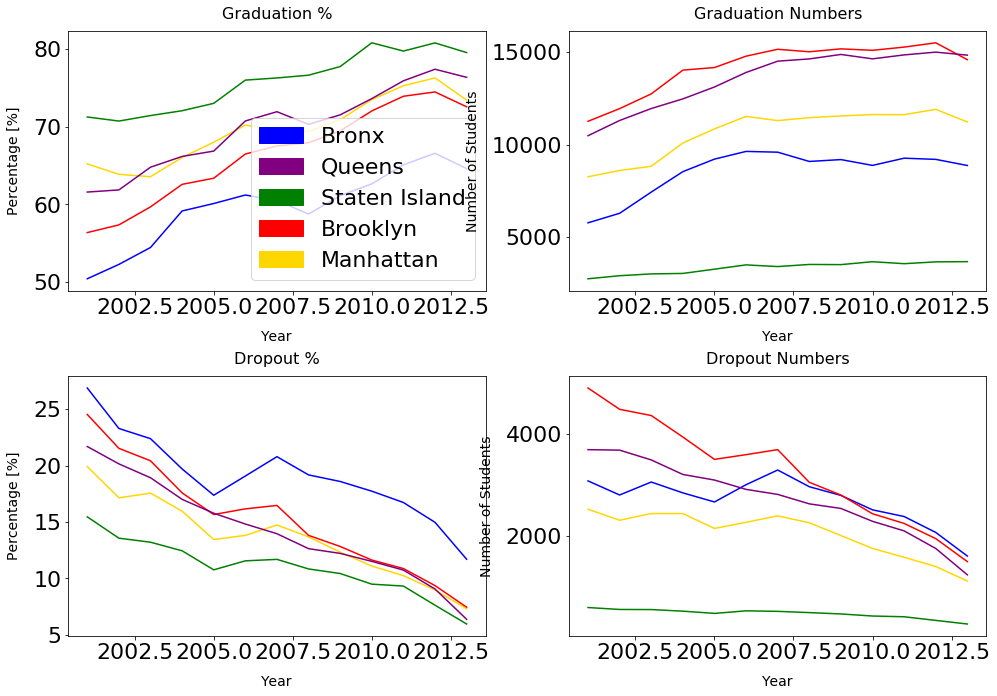

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10))
axs[0, 0].set_title('Graduation %', fontsize=16, pad=12)
axs[0, 1].set_title('Graduation Numbers', fontsize=16, pad=12)
axs[1, 0].set_title('Dropout %', fontsize=16, pad=12)
axs[1, 1].set_title('Dropout Numbers', fontsize=16, pad=12)

legend_dict = {'Bronx': 'blue', 'Queens': 'purple', 'Staten Island': 'green', 'Brooklyn': 'red', 'Manhattan': 'gold'}
patchlist = []
for key in legend_dict:
        data_key = mpatches.Patch(color=legend_dict[key], label=key)
        patchlist.append(data_key)


for borough, df in boroughs.items():
    axs[0, 0].plot(df['Year'], df['Total Grads %'], color=legend_dict[borough])
    axs[0, 1].plot(df['Year'], df['Total Grads'], color=legend_dict[borough])
    axs[1, 0].plot(df['Year'], df['Dropout %'], color=legend_dict[borough])
    axs[1, 1].plot(df['Year'], df['Dropout'], color=legend_dict[borough])

axs[0, 0].set_ylabel('Percentage [%]', fontsize=14, labelpad=12)
axs[0, 1].set_ylabel('Number of Students', fontsize=14, labelpad=12)
axs[1, 0].set_ylabel('Percentage [%]', fontsize=14, labelpad=12)
axs[1, 1].set_ylabel('Number of Students', fontsize=14, labelpad=12)

axs[0, 0].set_xlabel('Year', fontsize=14, labelpad=12)
axs[0, 1].set_xlabel('Year', fontsize=14, labelpad=12)
axs[1, 0].set_xlabel('Year', fontsize=14, labelpad=12)
axs[1, 1].set_xlabel('Year', fontsize=14, labelpad=12)

plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.33, wspace=0.2)

axs[0, 0].legend(handles=patchlist, loc='lower right')

We can see that the state of education has, generally, been improving among all boroughs between 2002 and 2013. The Bronx is lagging behind a little bit but has displayed all of the same improvement. 
This suggests that, in general, efforts have been made to improve education in NYC and, as long as trends continue, we have every reason to expect that education will only continue to improve.

Next, let us create maps to make the rates of graduation and dropout more visually apparent. 

For our maps and further exploration, we choose the year 2013 to examine:

In [ ]:
# We will pick the latest year available, 2013, for use here

# Filtering by year 2013
df_2013 = df_grads_dropouts[df_grads_dropouts['Year'] == 2013].reset_index(drop=True)

# Selecting the 4 year August cohort
df_2013 = df_2013.iloc[::2].reset_index(drop=True)

In [ ]:
# Mapping graduation rates (%)
grads_map = folium.Map(location=[40.75, -74],
                       tiles='cartodbpositron')

borough_edge = json.load(open(os.path.join('data', 'nyc-boroughs.json')))

folium.GeoJson(
    borough_edge,
    name='geojson',
    tooltip=folium.features.GeoJsonTooltip(fields=['borough'], aliases=['Borough'], labels=True, sticky=True)
).add_to(grads_map)

folium.Choropleth(
    geo_data=borough_edge, 
    data=df_2013,
    columns=['Borough', 'Total Grads %'],
    nan_fill_color='grey',
    bins=9,
    key_on = 'feature.properties.borough',
    fill_color='BuPu', fill_opacity=0.7, line_opacity=0.3, line_color='black',
    legend_name='Graduation Percentage in NYC Boroughs, 4 Year Class of August 2013',
    highlight=True).add_to(grads_map)

grads_map

In [ ]:
# Mapping dropout rates (%)
drops_map = folium.Map(location=[40.75, -74],
                       tiles='cartodbpositron')

borough_edge = json.load(open(os.path.join('data', 'nyc-boroughs.json')))

folium.GeoJson(
    borough_edge,
    name='geojson',
    tooltip=folium.features.GeoJsonTooltip(fields=['borough'], aliases=['Borough'], labels=True, sticky=True)
).add_to(drops_map)

folium.Choropleth(
    geo_data=borough_edge, 
    data=df_2013,
    columns=['Borough', 'Dropout %'],
    nan_fill_color='grey',
    bins=9,
    key_on = 'feature.properties.borough',
    fill_color='BuPu', fill_opacity=0.7, line_opacity=0.3, line_color='black',
    legend_name='Dropout Percentage in NYC Boroughs, 4 Year Class of August 2013',
    highlight=True).add_to(drops_map)

drops_map

We can see that, as is expected, the graduation rates are much higher in the wealthy parts of NYC (i.e. Manhattan and Queens) than the other boroughs.  
Furthermore, the dropout rate is much higher in the Bronx, generally a poorer NYC borough.

Next, we will follow a similar line of examination but on a per-postcode basis:  
Here, we simply prepare the data necessary to map schools to postcodes.

In [ ]:
school_data_xls = pd.ExcelFile('data/education/2017-graduation_rates_public_school.xlsx')
school_data_sheet_names = school_data_xls.sheet_names

In [ ]:
school_sheets = {}

for name in school_data_sheet_names:
    df = school_data_xls.parse(name, skiprows=list(range(7))) 
    school_sheets[name] = df
df_all_schools = school_sheets[school_data_sheet_names[1]]

In [ ]:
# Select only the columns we need
df_all_schools.rename(columns={'Unnamed: 0': 'DBN', 'Unnamed: 1': 'Name', 'Unnamed: 3': 'Year', 'Unnamed: 4': 'Cohort_Type', 'Unnamed: 7': 'Total Grads %', 'Unnamed: 23': 'Dropout %'}, inplace=True)
df_sch = df_all_schools[['DBN', 'Name', 'Year', 'Total Grads %', 'Dropout %']]
df_sch.drop(0, inplace=True)
df_sch.head()

,DBN,Name,Year,Total Grads %,Dropout %
1,01M292,ORCHARD COLLEGIATE ACADEMY,2013,69.4444,19.4444
2,01M292,ORCHARD COLLEGIATE ACADEMY,2012,54.5455,22.7273
3,01M292,ORCHARD COLLEGIATE ACADEMY,2011,63.0137,9.58904
4,01M292,ORCHARD COLLEGIATE ACADEMY,2010,42.623,27.8688
5,01M292,ORCHARD COLLEGIATE ACADEMY,2009,57.6471,9.41176


In [ ]:
# Simply removing useless entries

df_sch['Total Grads %'] = pd.to_numeric(df_sch['Total Grads %'], errors='coerce')
df_sch['Dropout %'] = pd.to_numeric(df_sch['Dropout %'], errors='coerce')
df_sch.dropna(inplace=True)

# Select 2013
df_2013_post = df_sch[df_sch['Year'] == 2013]
print(df_2013_post.dtypes)
df_2013_post.head()

DBN               object
Name              object
Year              object
Total Grads %    float64
Dropout %        float64
dtype: object


,DBN,Name,Year,Total Grads %,Dropout %
1,01M292,ORCHARD COLLEGIATE ACADEMY,2013,69.44444,19.444440
10,01M292,ORCHARD COLLEGIATE ACADEMY,2013,66.66666,19.444440
47,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2013,89.74358,8.974358
56,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2013,89.74358,8.974358
99,01M450,EAST SIDE COMMUNITY SCHOOL,2013,91.01123,3.370786


In [ ]:
# Now, we group the resulting dataframe by school names and average the percentages
df_2013_grouped = df_2013_post.groupby(['DBN', 'Name']).mean()
df_2013_grouped.head()

,,Total Grads %,Dropout %
DBN,Name,,
01M292,ORCHARD COLLEGIATE ACADEMY,68.055550,19.444440
01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,89.743580,8.974358
01M450,EAST SIDE COMMUNITY SCHOOL,90.449435,3.370786
01M458,FORSYTH SATELLITE ACADEMY,15.425525,12.765950
01M509,MARTA VALLE HIGH SCHOOL,69.491520,6.779661


### Education at the Postcode Level

In [ ]:
school_addr = pd.read_csv('data/education/school_addr/2016-doe-high-school-directory.csv')

In [ ]:
school_pos = school_addr[['dbn', 'Postcode']]
school_pos.rename(columns={'dbn': 'DBN', 'Postcode': 'ZIP CODE'}, inplace=True) # for consistency
school_pos.dropna(inplace=True)
school_pos.head()

school_pos.describe()

# Here, we've found positions for most schools in NYC. 

,ZIP CODE
count,437.000000
mean,10723.951945
std,537.785205
min,10001.000000
25%,10301.000000
50%,10469.000000
75%,11217.000000
max,11694.000000


In [ ]:
# Printing entry with the lowest graduation rate
df_2013_grouped.loc[df_2013_grouped['Total Grads %'].idxmin()]

Total Grads %      0.0
Dropout %        100.0
Name: (12X278, PEACE AND DIVERSITY ACADEMY), dtype: float64

As we can see, there are some severe outliers and issues. The above entry, for instance, is clearly flawed (as a school cannot possibly have a 100% dropout rate).

In [ ]:
# Merging the two to position our schools properly
df_merged = df_2013_grouped.merge(school_pos, on='DBN', how='outer')
df_merged.dropna(inplace=True)

# Drop rows with absurdly high dropout rates and low graduation rates
df_merged = df_merged[df_merged['Dropout %'] < 60] 
df_merged = df_merged[df_merged['Total Grads %'] > 40]

df_merged = df_merged.groupby(['ZIP CODE']).mean().reset_index()
df_merged.head()

,ZIP CODE,Total Grads %,Dropout %
0,10002.0,85.073264,4.839013
1,10003.0,80.451124,5.241847
2,10004.0,78.858769,9.008314
3,10006.0,78.603625,6.709189
4,10009.0,90.449435,3.370786


As we do not have data on schools from every single postcode, we will add empty rows for each missing postcode so that they can later be interpolated.

In [ ]:
# Adding in missing postcode values:
df_merged['ZIP CODE'] = df_merged['ZIP CODE'].astype(int)
postcode_edge = json.load(open(os.path.join('data', 'nyc-postcode.json')))

zipcodes = set()
for feature in postcode_edge["features"]:
    zipcodes.add(int(feature["properties"]['postalCode']))

for code in zipcodes:
    if code not in df_merged['ZIP CODE'].unique():
        df_merged = df_merged.append({'ZIP CODE': int(code), 'Total Grads %': np.NaN, 'Dropout %': np.NaN}, ignore_index=True)

# Remove invalid zipcodes
df_merged = df_merged[df_merged['ZIP CODE'] >= 10000]
df_merged = df_merged.sort_values(by='ZIP CODE').reset_index(drop=True)

Due to the limitations of our data, a large amount of zipcodes are left without any education data, making it more difficult to come to conclusions.  
Note, also, that two postcodes which are physically close to each other (and, thus, have similar education properties) generally also have similar postcode numbers. 

Thus, we will simply linearly interpolate the NaN values and see if the interpolation seems fair.

In [ ]:
df_merged_interp = df_merged.interpolate()
df_merged_interp.head(3)

,ZIP CODE,Total Grads %,Dropout %
0,10001.0,NaN,NaN
1,10002.0,85.073264,4.839013
2,10003.0,80.451124,5.241847


In [ ]:
# Notice that the first row wasn't succesfully interpolated so we'll manually set it equal to the second row

df_merged_interp.loc[0][['Total Grads %', 'Dropout %']] = df_merged_interp.loc[1][['Total Grads %', 'Dropout %']]
df_merged_interp.head(3)

,ZIP CODE,Total Grads %,Dropout %
0,10001.0,85.073264,4.839013
1,10002.0,85.073264,4.839013
2,10003.0,80.451124,5.241847


Let us graph the original and interpolated data to compare the two and see if the chosen interpolation is fair:

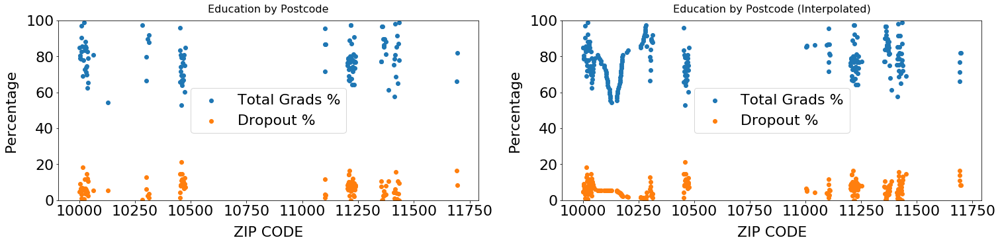

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(25, 5))
axs[0].set_title('Education by Postcode', fontsize=16, pad=12)
axs[0].scatter(df_merged['ZIP CODE'], df_merged['Total Grads %'])
axs[0].scatter(df_merged['ZIP CODE'], df_merged['Dropout %'])
axs[1].set_title('Education by Postcode (Interpolated)', fontsize=16, pad=12)
axs[1].scatter(df_merged_interp['ZIP CODE'], df_merged_interp['Total Grads %'])
axs[1].scatter(df_merged_interp['ZIP CODE'], df_merged_interp['Dropout %'])

for ax in axs:
    ax.set_ylim(0, 100)
    ax.set_xlabel('ZIP CODE', labelpad=12)
    ax.set_ylabel('Percentage', labelpad=12)
    ax.legend(loc='center')

We can see that the interpolation provides values well within reason. Postcodes closer to each other having more similar interpolated values - exactly what one would expect from real-world data.

Next, let us map the Graduation % and Dropout % so that we can get an intuitive feel for things:

In [ ]:
# Convert postcodes to strings for compatability with the json postcodes
df_merged_interp['ZIP CODE'] = df_merged_interp['ZIP CODE'].astype(str).apply(lambda x: x[:-2])

In [ ]:
grads = draw_heatmap(name='Graduation percentage 2013',
                  data=df_merged_interp, feature= 'Total Grads %',
                  title='Graduation Percentage by NYC Postcodes, Class of 2013', 
                  filepath = "maps/education/NYC_grad2013.html")

grads

In [ ]:
drops = draw_heatmap(name='Dropout percentage 2013',
                  data=df_merged_interp, feature= 'Dropout %',
                  title='Dropout Percentage by NYC Postcodes, Class of 2013', 
                  filepath = "maps/education/NYC_dropout2013.html")

drops

### Custom Metric

As seen above, we have been examining two properties of education which are both intuitively relevant to quality of education. Comparing against two metrics simultaneously, though, can be tedious for readers and, so, it makes sense to combine them into a single metric. For the sake of simplicity and transparency, we have chosen the following metric, scaled to [0, 1]:

$$\text{Score} = \log\bigg(\frac{\text{Total Grads %}}{\text{Dropout %}}\bigg)$$

In [ ]:
df_merged_interp['Metric'] = df_merged_interp['Total Grads %'] / df_merged_interp['Dropout %']
df_merged_interp.head()

,ZIP CODE,Total Grads %,Dropout %,Metric
0,10001,85.073264,4.839013,17.580705
1,10002,85.073264,4.839013,17.580705
2,10003,80.451124,5.241847,15.347857
3,10004,78.858769,9.008314,8.753999
4,10005,78.731197,7.858751,10.018283


Let us print some information about this Metric column:  
*Replacing p.inf with $0$ in order to get some useful result*

In [ ]:
df_merged_interp['Metric'].replace(np.inf, 0).describe()

count     246.000000
mean       34.385747
std       106.701380
min         0.000000
25%         8.723622
50%        12.744103
75%        23.080153
max      1209.854171
Name: Metric, dtype: float64

We can see that there are at least a few extreme outliers. So we will graph the metric to see them more clearly:

10001


<function matplotlib.pyplot.show(*args, **kw)>

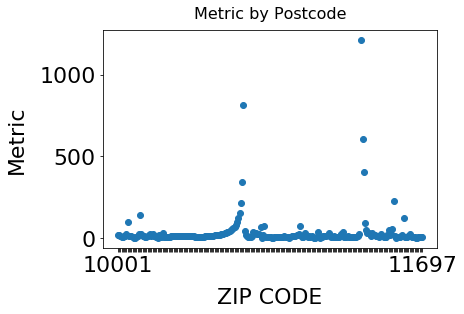

In [ ]:
plt.title('Metric by Postcode', fontsize=16, pad=12)
plt.scatter(df_merged_interp['ZIP CODE'], df_merged_interp['Metric'])
plt.xlabel('ZIP CODE', labelpad=12)
plt.ylabel('Metric', labelpad=12)
labels = ['']*len(df_merged_interp)
print(df_merged_interp['ZIP CODE'].min())
labels[0]=df_merged_interp['ZIP CODE'].min()
labels[-1]=df_merged_interp['ZIP CODE'].max()
plt.xticks(np.arange(len(df_merged_interp)), labels)

plt.show

Quite clearly, it's worth removing the offending postcodes.

Let us remove the top 15 rows with highest metric scores:

In [ ]:
for i in range(15):
    df_merged_interp.drop(df_merged_interp['Metric'].idxmax(), inplace=True)

Graphing again:

10001


<function matplotlib.pyplot.show(*args, **kw)>

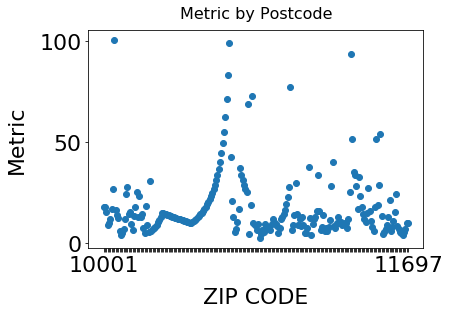

In [ ]:
plt.title('Metric by Postcode', fontsize=16, pad=12)
plt.scatter(df_merged_interp['ZIP CODE'], df_merged_interp['Metric'])
plt.xlabel('ZIP CODE', labelpad=12)
plt.ylabel('Metric', labelpad=12)
labels = ['']*len(df_merged_interp)
print(df_merged_interp['ZIP CODE'].min())
labels[0]=df_merged_interp['ZIP CODE'].min()
labels[-1]=df_merged_interp['ZIP CODE'].max()
plt.xticks(np.arange(len(df_merged_interp)), labels)

plt.show

Already, this looks better. Now, we can scale the value to the range [0, 1].  
As there is a disproportionately large number of postcodes with small metric values, we will first take the log of the scores and then scale them

In [ ]:
df_merged_interp['Metric'].describe()

count    231.000000
mean      17.728172
std       16.465917
min        2.497091
25%        8.733748
50%       12.549985
75%       18.917662
max      100.510008
Name: Metric, dtype: float64

In [ ]:
df_merged_interp['Normalized'] = np.log(df_merged_interp['Metric'])
df_merged_interp['Normalized'] = df_merged_interp['Normalized'] - df_merged_interp['Normalized'].min()
df_merged_interp['Normalized'] = df_merged_interp['Normalized'] / df_merged_interp['Normalized'].max()

In [ ]:
df_merged_interp.head()

,ZIP CODE,Total Grads %,Dropout %,Metric,Normalized
0,10001,85.073264,4.839013,17.580705,0.528175
1,10002,85.073264,4.839013,17.580705,0.528175
2,10003,80.451124,5.241847,15.347857,0.491417
3,10004,78.858769,9.008314,8.753999,0.339469
4,10005,78.731197,7.858751,10.018283,0.375977


In [ ]:
df_merged_interp['Normalized'].describe()

count    231.000000
mean       0.457210
std        0.186297
min        0.000000
25%        0.338842
50%        0.436952
75%        0.547994
max        1.000000
Name: Normalized, dtype: float64

In [ ]:
metric = draw_heatmap(name='Metric 2013',
                  data=df_merged_interp, feature= 'Normalized',
                  title='Metric by NYC Postcodes, Class of 2013', 
                  filepath = "maps/education/NYC_metric2013.html")

metric

### Education Conclusion

We can see that, interestingly, Staten Island appears to have the most reliably highest scores according to our above metric. This means that, in Staten Island, most schools have both a high graduation rate and a low dropout rate.

In the Bronx, as expected, the scores tend to be lower all around. While, in Brooklyn, Queens, and Manhattan, there are distinct areas with high scores. 